In [150]:
import cv2
import matplotlib.pyplot as plt
import deepdish as dd
import numpy as np
import random
import time
import math

# data = dd.io.load("dataset/fabric_pose_class_0405.h5")
# # data = np.load(f"/media/data2/shawn/fabric/dataset/fabric_class_0828.npz", allow_pickle=True)
# data = np.load(f"dataset/fabric_class_0828.npz", allow_pickle=True)
# data_test = np.load(f"/media/data2/shawn/fabric/dataset/fabric_class_test_0828.npz", allow_pickle=True)


data = np.load(f"/media/data2/shawn/fabric/dataset/fabric_class_0824.npz", allow_pickle=True)
data_test = np.load(f"/media/data2/shawn/fabric/dataset/fabric_class_test_0824.npz", allow_pickle=True)

# X, Y = data["X"], data["Y"]
# X, Y = np.array(X), np.array(Y)
# X.shape

# Y[:,2] /= 90.

In [ ]:
# X = data["X"]
# Y = data["Y"]
# X_test = data_test["X"]
# Y_test = data_test["Y"]

X = data["X"]
X_width_cmd = data["X_width_cmd"]
X_width = data["X_width"]
Y = data["Y"]
X_test = data["X"]
X_width_cmd_test = data["X_width_cmd"]
X_width_test = data["X_width"]
Y_test = data["Y"]

In [16]:
from util.reconstruction import Class_3D
from util.reconstruction import demark
from util import helper

# sensor_id = "W00"
sensor_id = "Fabric"
model_id = "RGB"
model_fn = f"models/LUT_{sensor_id}_{model_id}.pkl"
c3d = Class_3D(model_fn=model_fn, features_type=model_id)

In [29]:
print("X_max", Y_test.max(), "X_min", Y_test.min())

X_max 4 X_min 0


In [139]:
idx = list(range(X.shape[0]))
random.shuffle(idx)
X, Y = X[idx], Y[idx]

# X_train, Y_train = np.concatenate((X[:, 0], X[:, 1], X[:, 2], X[:, 3], X[:, 4]), axis=3), Y
# X_test, Y_test = np.concatenate((X_test[:, 0], X_test[:, 1], X_test[:, 2], X_test[:, 3], X_test[:, 4]), axis=3), Y_test

In [83]:
print(X_train.shape)
X_test.shape

(8700, 90, 120, 15)


(110, 90, 120, 15)

In [140]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 32, 5)
#         self.conv4 = nn.Conv2d(32, 128, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(32 * 7 * 11, 512)
#         self.fc1 = nn.Linear(128 * 1 * 3, 120)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 5)
#         self.fcb = nn.Linear(2, 128)
#         self.fc_concat = nn.Linear(256, 5)

    def forward(self, x):
        x = x.permute(0, 3, 1, 2)
        x = torch.tanh(self.conv1(x))
        x = self.pool(x)
        x = torch.tanh(self.conv2(x))
        x = self.pool(x)
        x = torch.tanh(self.conv3(x))
        x = self.pool(x)
#         x = self.pool(torch.tanh(self.conv4(x)))
#         x = x.permute(0, 2, 3, 1)
#         print(x.size())
        x = x.reshape(-1, 32 * 7 * 11)
        x = torch.tanh(self.fc1(x))
        x = torch.tanh(self.fc2(x))
#         x2 = torch.tanh(self.fcb(torch.cat((xw_c, xw), 1)))
#         x = self.fc_concat(torch.cat((x, x2),1))
#         x = F.relu(self.fc1(x))
#         x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

    def fit(self, X_train, Y_train, device, lrate=0.01, num_iters=100):
        batch_size = 32
        N = X_train.shape[0]


        optim = torch.optim.Adam(self.parameters(), lr=lrate)
        sum_loss = 0
        total = 0
        
        for epoch in range(num_iters):
            
#             sum_loss = 0
#             total = 0
        
            
            if epoch % 5 == 0:
                idx = list(range(N))
                random.shuffle(idx)

                X_train = X_train[idx]
                Y_train = Y_train[idx]
        
            for i in range(N // batch_size):
                # clear gradients accumulated on the parameters
                optim.zero_grad()
                
                x_np = X_train[i * batch_size : (i + 1) * batch_size].copy()
                x = torch.tensor(x_np, dtype=torch.float32).to(device)

                y = torch.tensor(
                    Y_train[i * batch_size : (i + 1) * batch_size], dtype=torch.float32
                ).to(device)
    
#                 xw_c = torch.tensor(
#                     X_width_cmd_train[i * batch_size : (i + 1) * batch_size], dtype=torch.float32
#                 ).to(device).view(-1, 1)
        
#                 xw = torch.tensor(
#                     X_width_train[i * batch_size : (i + 1) * batch_size], dtype=torch.float32
#                 ).to(device).view(-1, 1)

                # forward pass
                result = self.forward(x)  # CHANGED: fc => net

                # compute loss
                criterion = nn.CrossEntropyLoss()   
                loss = criterion(result, y.long())

                # compute gradients
                loss.backward()

                # let the optimizer do its work; the parameters will be updated in this call
                optim.step()

                sum_loss += loss.item()
#                 if i % 100 == 0:
#                     print(loss.item())
                total += 1
                # add some printing
            if (epoch + 1) % 1 == 0:
                Y_pred = net.predict(X_train[:1000], device)
                correct = 0
                for j in range(1000):
                    probs = torch.softmax(torch.from_numpy(Y_pred[j]), dim=0)
                    winner = probs.argmax(dim=0)
                    if winner == Y_train[j]:
                        correct += 1
                training_acc = correct/1000
                Y_pred = net.predict(X_test/10, device)
                correct = 0
                for k in range(Y_test.shape[0]):
                    probs = torch.softmax(torch.from_numpy(Y_pred[k]), dim=0)
                    winner = probs.argmax(dim=0)
                    if winner == Y_test[k]:
                        correct += 1
                test_acc = correct/Y_test.shape[0]
                
                print(
                    "epoch {}\titeration {}\tloss {:.8f}\ttraining {:.3f}\ttest {:.3f}".format(
                        epoch, i, sum_loss / total, training_acc, test_acc
                    )
                )

    def predict(self, X_test, device):
        with torch.no_grad():
            #             return self.forward(torch.tensor(X_frames_test, dtype=torch.float32).to(device), torch.tensor(X_width_cmd_test, dtype=torch.float32).to(device).view(-1, 1), torch.tensor(X_width_test, dtype=torch.float32).to(device).view(-1, 1)).cpu().numpy()
            return self.forward(torch.tensor(X_test, dtype=torch.float32).to(device)).cpu().numpy()


device = torch.device("cuda:0")

# x = torch.tensor(X[:5], dtype=torch.float32).to(device)
# y = net(x)
# print(y.size())

In [141]:
net = Net().to(device)

In [131]:
net.fit(X_train, Y_train, device, lrate=0.0001, num_iters=100)


epoch 0	iteration 270	loss 0.91874477	training 0.815	test 0.664
epoch 1	iteration 270	loss 0.67285582	training 0.873	test 0.718
epoch 2	iteration 270	loss 0.55808389	training 0.901	test 0.745
epoch 3	iteration 270	loss 0.48880102	training 0.917	test 0.764
epoch 4	iteration 270	loss 0.43909373	training 0.926	test 0.782
epoch 5	iteration 270	loss 0.39985156	training 0.935	test 0.836
epoch 6	iteration 270	loss 0.36797448	training 0.945	test 0.845
epoch 7	iteration 270	loss 0.34122951	training 0.952	test 0.845
epoch 8	iteration 270	loss 0.31854915	training 0.956	test 0.864
epoch 9	iteration 270	loss 0.29899574	training 0.963	test 0.891
epoch 10	iteration 270	loss 0.28153374	training 0.972	test 0.836
epoch 11	iteration 270	loss 0.26579147	training 0.975	test 0.836
epoch 12	iteration 270	loss 0.25154167	training 0.979	test 0.864
epoch 13	iteration 270	loss 0.23856036	training 0.981	test 0.864
epoch 14	iteration 270	loss 0.22663979	training 0.985	test 0.855
epoch 15	iteration 270	loss 0.21592

KeyboardInterrupt: 

In [132]:
torch.save(net.state_dict(), "models/class_grasp_seq_0830.pth")

In [143]:
net.load_state_dict(torch.load("models/class_grasp_img_0830.pth", map_location=device)) #

<All keys matched successfully>

In [144]:
Y_pred = net.predict(X_test / 10., device)
probs = torch.softmax(torch.from_numpy(Y_pred), dim=1)
# print(probs)
preds = probs.argmax(dim=1)
stacked = torch.stack((torch.tensor(Y_test), preds), dim=1)
cmt = torch.zeros(5,5, dtype=torch.int64)
for p in stacked:
    tl, pl = p.tolist()
    cmt[tl, pl] = cmt[tl, pl] + 1
print(cmt)


tensor([[22,  0,  0,  0,  0],
        [ 0, 20,  0,  2,  0],
        [ 0,  0, 22,  0,  0],
        [ 0,  0,  0, 22,  0],
        [ 1,  5,  3,  2, 11]])


In [145]:
Y_pred = net.predict(X_test/10., device)
correct = 0
for k in range(Y_test.shape[0]):
    probs = torch.softmax(torch.from_numpy(Y_pred[k]), dim=0)
    winner = probs.argmax(dim=0)
    if winner == Y_test[k]:
        correct += 1
#     else:
#         print(winner, Y_test[k])
test_acc = correct/Y_test.shape[0]
print(test_acc, correct, Y_test.shape[0])
cmt = torch.zeros(5,5, dtype=torch.int64)
for p in stacked:
    tl, pl = p.tolist()
    cmt[tl, pl] = cmt[tl, pl] + 1
print(cmt)

0.8818181818181818 97 110
tensor([[22,  0,  0,  0,  0],
        [ 0, 20,  0,  2,  0],
        [ 0,  0, 22,  0,  0],
        [ 0,  0,  0, 22,  0],
        [ 1,  5,  3,  2, 11]])


In [146]:
from sklearn.metrics import confusion_matrix
import itertools
import numpy as np
import matplotlib.pyplot as plt

cm = confusion_matrix(torch.tensor(Y_test), preds)

correct = 0
for k in range(Y_test.shape[0]):
    probs = torch.softmax(torch.from_numpy(Y_pred[k]), dim=0)
    winner = probs.argmax(dim=0)
    if winner == Y_test[k]:
        correct += 1
        
test_acc = correct/Y_test.shape[0]
print(test_acc, correct, Y_test.shape[0])

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

0.8818181818181818 97 110


Confusion matrix, without normalization
[[22  0  0  0  0]
 [ 0 20  0  2  0]
 [ 0  0 22  0  0]
 [ 0  0  0 22  0]
 [ 1  5  3  2 11]]
0.8818181818181818


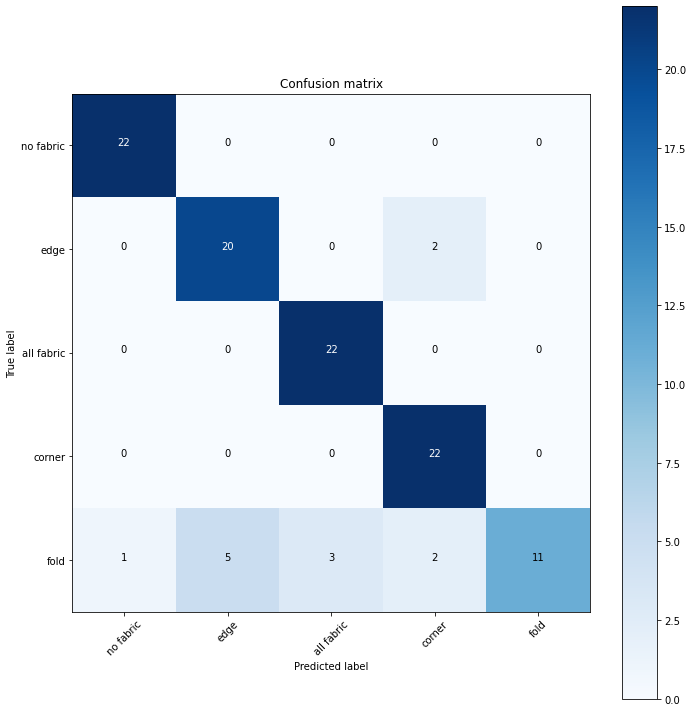

In [147]:
plt.figure(figsize=(10,10))
plot_confusion_matrix(cm, ["no fabric", "edge", "all fabric", "corner", "fold"], normalize=False)
print(np.trace(cm).sum() / cm.sum()) 

In [149]:
# Y_pred = net.predict(X_frames_real, X_width_cmd_real, X_width_real, device)
Y_pred = net.predict(X_test/10, device)

correct = 0
total = 0
# for i in range(1000):
for i in range(Y_test.shape[0]):
#     print(Y_test[i])
    probs = torch.softmax(torch.from_numpy(Y_pred[i]), dim=0)
    winner = probs.argmax(dim=0)
#     if (winner == Y_real[i]):
    if (winner == 1 and Y_test[i] == 1) or (winner != 1 and Y_test[i] != 1):
        correct += 1
    total += 1
#     else: 
#         print(probs)
#         print(winner)
#         print("actual: ", Y_test[i])
#     x = cv2.resize(X_frames_test[i], (400, 300))
#     imshow(x)
print(correct/total)

0.9363636363636364


In [ ]:
cm[1, 1]

In [10]:
Y_pred = net.predict(X_frames_test, X_width_cmd_test, X_width_test, device)
# Y_pred = Y_test


def imshow(im, vmin=0, vmax=1):
    plt.imshow(im[:,:,::-1], vmax=vmax, vmin=vmin)
    plt.show()

correct = 0
total = 0
for i in range(Y_test.shape[0]):
#     print(Y_test[i])
    probs = torch.softmax(torch.from_numpy(Y_pred[i]), dim=0)
    winner = probs.argmax(dim=0)
    if winner == Y_test[i]:
        correct += 1
#     else: 
#         print(probs)
#         print(winner)
#         print("actual: ", Y_test[i])
#         x = cv2.resize(X_frames_test[i], (400, 300))
#         imshow(x)
    total += 1
print(correct/total)

0.996


In [153]:
Y_pred = net.predict(X_frames_train[:1000], X_width_cmd_train[:1000], X_width_train[:1000], device)
# Y_pred = Y_test


correct = 0
total = 0
for i in range(1000):
#     print(Y_test[i])
    probs = torch.softmax(torch.from_numpy(Y_pred[i]), dim=0)
    winner = probs.argmax(dim=0)
    if winner == Y_train[i]:
        correct += 1
    total += 1
#     else: 
#         print(probs)
#         print(winner)
#         print("actual: ", Y_test[i])
    
#     x = cv2.resize(X_frames_test[i], (400, 300))
#     imshow(x)
print(correct/total)

1.0


In [ ]:
def get_all_preds(model, loader):
    all_preds = torch.tensor([])
    for batch in loader:
        images, labels = batch

        preds = model(images)
        all_preds = torch.cat(
            (all_preds, preds)
            ,dim=0
        )
    return all_preds

In [36]:
frames = dd.io.load("data/fabric_0319.h5")

In [627]:
len(frames)

856

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.00022115797948579763


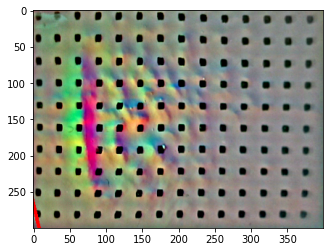

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0007536490922013805


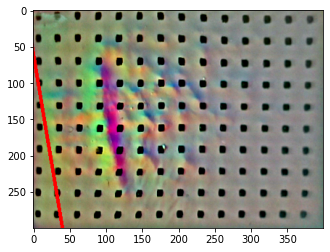

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0009181669117262065


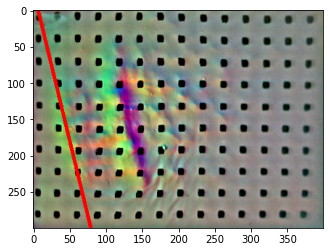

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0008066433816667079


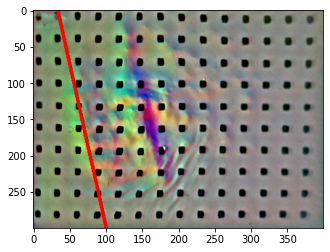

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0006915934992690609


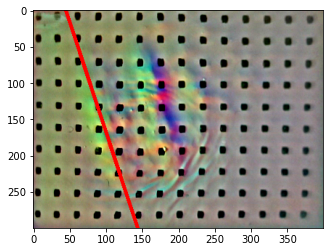

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0007401848786297571


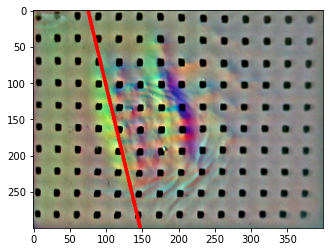

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0008445073406184722


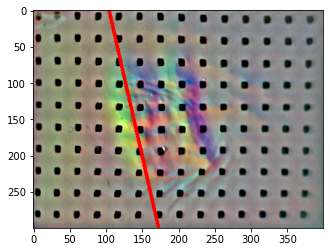

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0007237539559810102


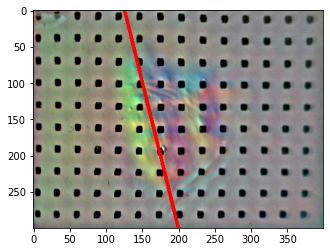

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0005655064465177745


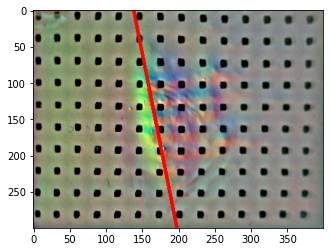

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0004979131387694569


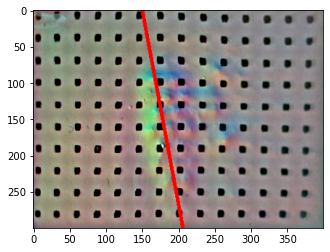

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00042708938643477856


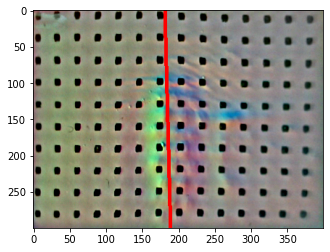

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00036022824504934603


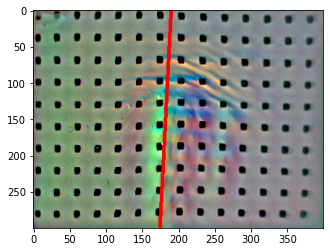

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0003247780109918441


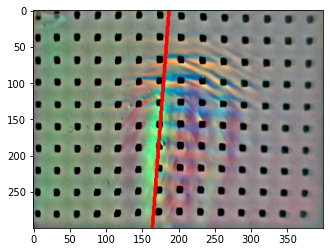

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0002499658110806241


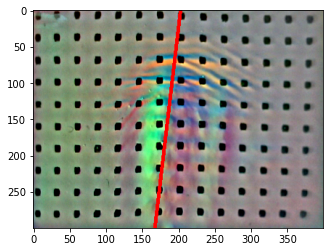

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00026379546348570537


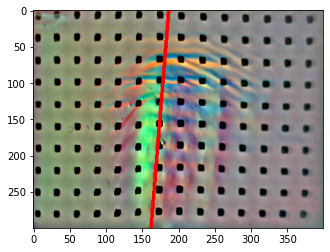

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.000273134860369742


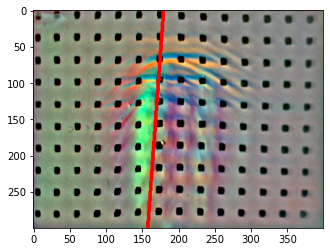

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0003340433052948649


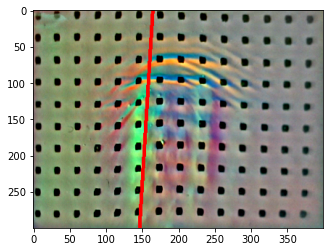

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00017467841238473503


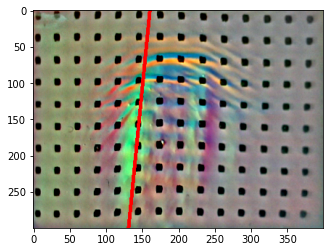

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0001724635713007544


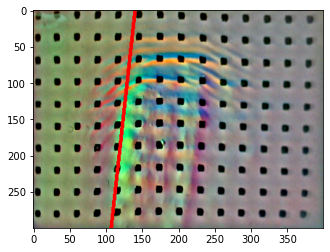

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00011531233042227917


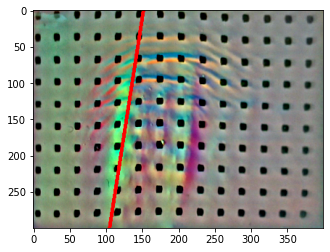

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  6.824736455973701e-05


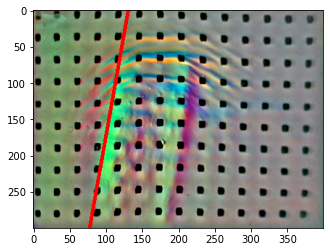

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  4.7400141338693746e-05


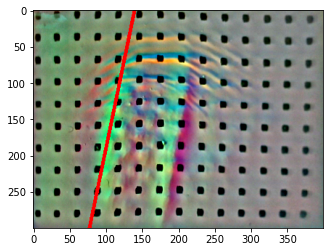

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00011402813320793292


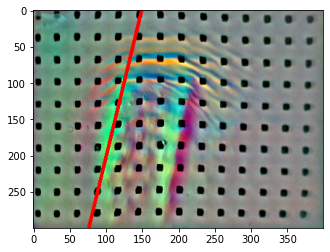

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  9.714574019970001e-05


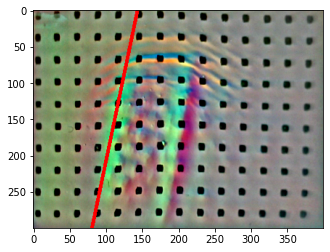

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0002573436621879921


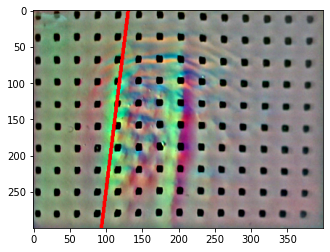

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00099466767023082


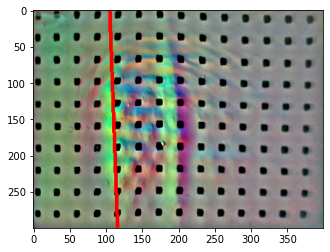

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0012234684637895676


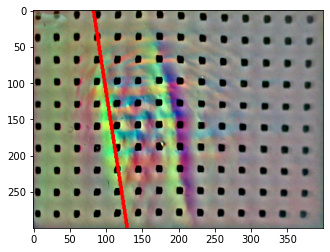

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0009983786242742654


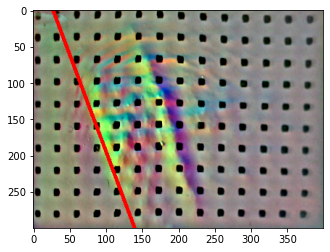

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0013070509805604424


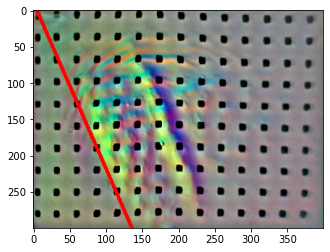

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0015476514749344222


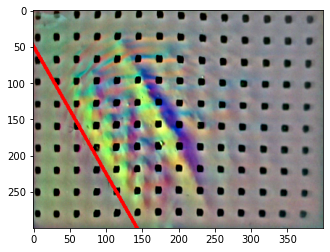

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0019955164615479554


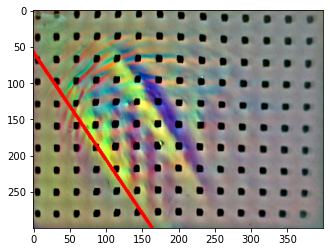

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0014587814065065846


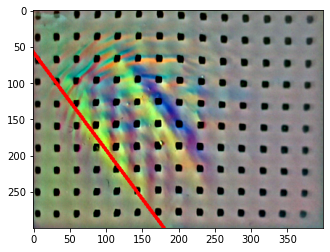

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0009510772313797156


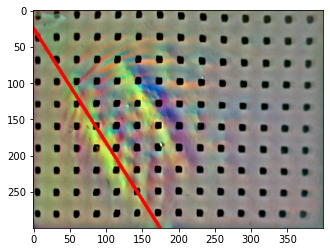

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0005512733996849845


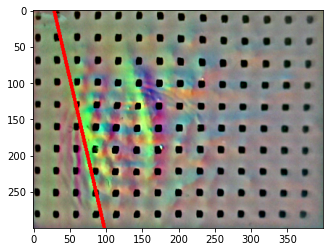

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  5.8653595715052464e-05


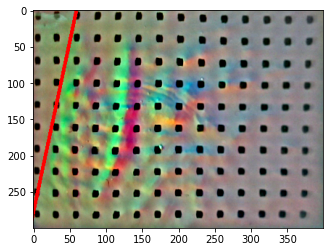

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  6.239168998446731e-05


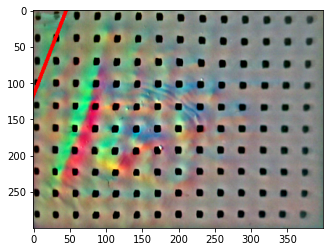

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.00026199488205626287


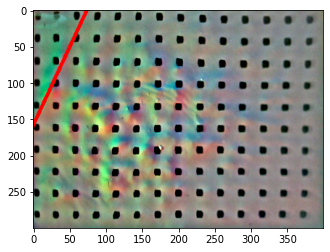

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  8.804524126472535e-05


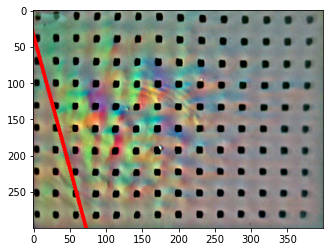

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.00024146751953281476


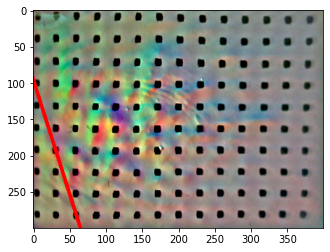

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  1.6462796481597763e-05


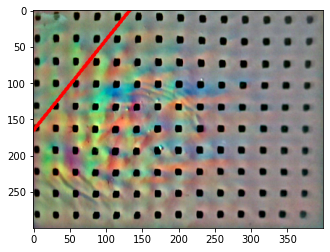

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  6.452980612797754e-05


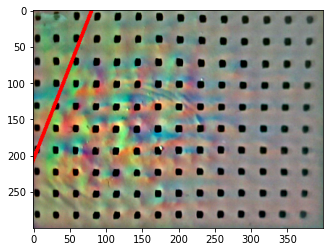

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.00018496717392248174


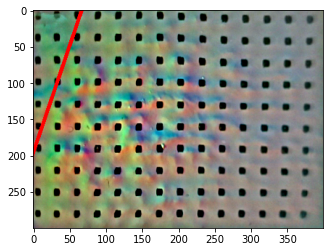

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  8.403417414015735e-05


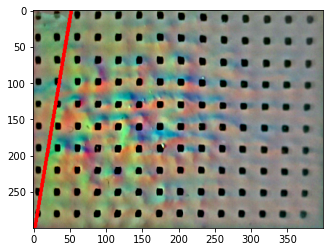

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.00094636012155426


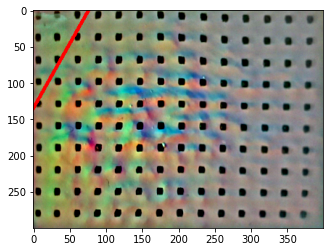

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.0027402088710779537


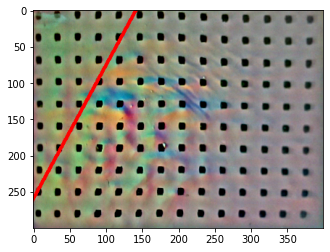

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.0038268811506703693


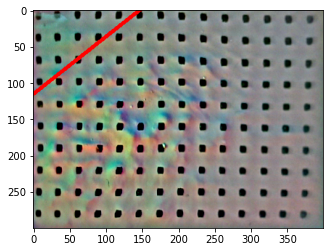

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.006373714883640469


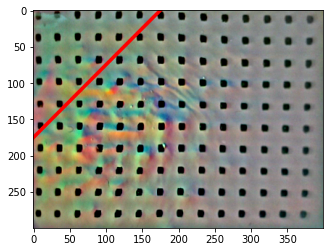

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.005311850594794443


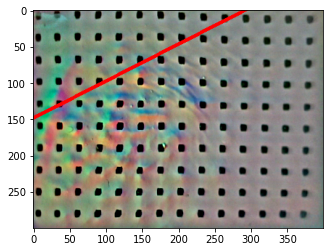

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  0.0018280429296881895


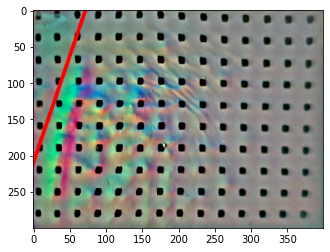

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(2)
sigma:  4.9742377528652626e-05


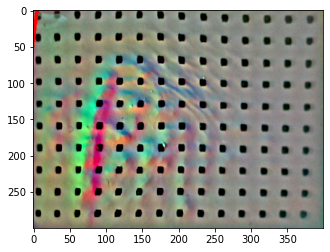

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.00016634739990412095


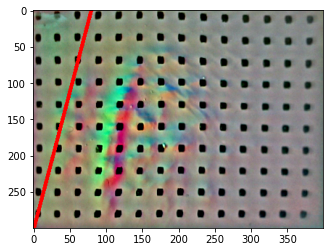

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  6.592309311050093e-05


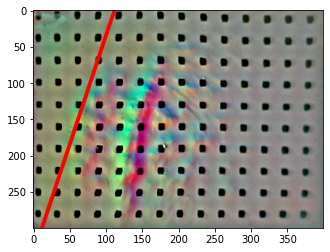

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  6.614832107677826e-05


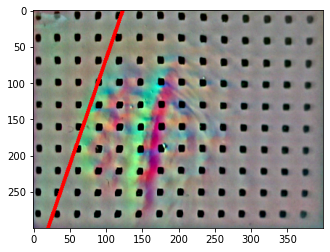

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0001902013013139886


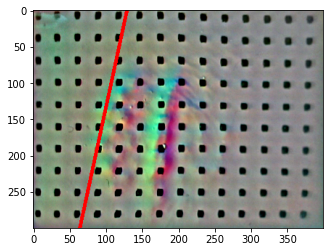

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


category:  tensor(1)
sigma:  0.0002318851625385948


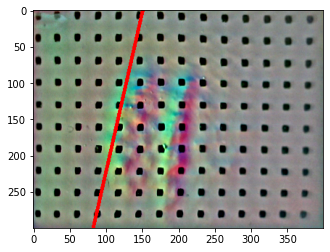

In [37]:
frame0 = frames[0]
# frame = frames[280]
frame = frames[460]
frame0_blur = cv2.GaussianBlur(frame0, (45, 45), 0)
# imgs = []

# for _ in range(150, 660, 3):
for _ in range(300, 850, 10):
# for _ in range(420, 1020):
    frame = frames[_]
    diff_magnified = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
    diff = (frame * 1.0 - frame0_blur) / 255. + 0.5
    diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
#     depth3 = np.dstack([depth / 30] * 3)
    depth3 = np.dstack([depth] * 3)
#     rendered_small = cv2.resize(frame/255., (120, 90))

#     Y_pred = net.predict([rendered_small], device)
    Y_pred = net.predict([depth3 * 120/400], device)
    i = 0
#     x = rendered_small
    x = diff_small
    y = Y_pred[i]
    
    probs = torch.softmax(torch.from_numpy(y[5:]), dim=0)
    winner = probs.argmax(dim=0)
    print("category: ", winner)
    print("sigma: ", y[4]**2)

#     x = cv2.resize(x, (400, 300))
    x = diff_magnified
#     x = cv2.resize(depth3 * 120/400, (400, 300))
    theta = np.arctan2(y[2], y[3])
    rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
#     rendered_img_line = draw_line(x, theta / np.pi * 180., y[0], 0)
    
    plt.figure()
    imshow(rendered_img_line)

#     imgs.append(rendered_img_line)


In [ ]:
np.save("results/fabric_sg_depth.npy", imgs)

In [634]:
import time

frame0 = frames[0]

t0 = time.time()

for _ in range(50, 850):
    frame = frames[_]
    diff = (frame * 1.0 - frame0) / 255. + 0.5
    diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
    depth3 = np.dstack([depth] * 3)
#     depth_small = cv2.resize(depth3, (120, 90))
    
#     rendered_small = cv2.resize(diff, (120, 90))
#     rendered_small = cv2.resize(frame/255., (120, 90))

    Y_pred = net.predict([depth3*120/400], device)
#     i = 0
#     x = rendered_small
#     y = Y_pred[i]
#     print(Y_pred[i])

#     x = cv2.resize(x, (400, 300))
#     theta = np.arctan2(y[2], y[3])
#     rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
#     plt.figure()
#     imshow(rendered_img_line)

tf = time.time()

print((tf-t0)/800)

# depth takes .16s (6 Hz)
# downscaled depth takes .035s (29Hz)
# rendered image takes 0.0176s (56Hz)
# difference image takes .0184s (54 Hz)
# network with classifier takes .03s (33 Hz)

0.030339207351207733


In [ ]:
frame0 = frames[0]
frame = frames[600]
diff = (frame * 1.0 - frame0) / 255. * 4 + 0.5
diff_small = cv2.resize(diff, (120, 90))
depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
depth2 = np.dstack([depth / 10] * 3)
print(depth2.shape)
plt.imshow(depth2)
# plt.imshow(depth, cmap="gray", vmin=0)


In [155]:
net.load_state_dict(torch.load("models/edge_markers_depth.pth", map_location=device))

<All keys matched successfully>

In [90]:
gt1 = dd.io.load("data/fabric_groundtruth1.h5")
gt2 = dd.io.load("data/fabric_groundtruth2.h5")
gt3 = dd.io.load("data/fabric_groundtruth3.h5")
gt4 = dd.io.load("data/fabric_groundtruth4.h5")
gt5 = dd.io.load("data/fabric_groundtruth5.h5")

In [158]:
sum_theta_error = 0
sum_xy_error = 0
total = 0

frame0 = gt3[0]
frame0_blur = cv2.GaussianBlur(frame0, (45, 45), 0)

for _ in range(308, 630):
    frame = gt1[_]
    diff = (frame * 1.0 - frame0_blur) / 255. * 4 + 0.5
#     diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff * 255.0, demark=demark, display=False)
    depth3 = np.dstack([depth / 30] * 3)
    depth3_small = cv2.resize(depth3, (120, 90))
    Y_pred = net.predict([depth3_small], device)
    y = Y_pred[0]
    theta = np.arctan2(y[2], y[3])
    x = np.zeros(3)
    
    # interpolated labels
    lo = 308
    hi = 400
    if _ < 400:
        x[0] = (_-lo)*1.*(157-144)/(hi-lo) + 144
        x[1] = (_-lo)*1.*(180-175)/(hi-lo) + 175
        x[2] = (_-lo)*1.*(-2+3)/(hi-lo) - 3
    elif _ < 500:
        lo = 400
        hi = 500
        x[0] = (_-lo)*1.*(175-157)/(hi-lo) + 157
        x[1] = (_-lo)*1.*(184-180)/(hi-lo) + 180
        x[2] = (_-lo)*1.*(-4+2)/(hi-lo) - 2
    elif _ < 600:
        lo = 500
        hi = 600
        x[0] = (_-lo)*1.*(183-175)/(hi-lo) + 175
        x[1] = (_-lo)*1.*(190-184)/(hi-lo) + 184
        x[2] = (_-lo)*1.*(-2+4)/(hi-lo) - 4
    else:
        lo = 600
        hi = 630
        x[0] = (_-lo)*1.*(186-183)/(hi-lo) + 144
        x[1] = (_-lo)*1.*(190-190)/(hi-lo) + 175
        x[2] = (_-lo)*1.*(-3+2)/(hi-lo) - 2
    
    total += 1
#     print("theta: ", theta)
#     print("x, y: ", y[0]*400, y[1]*300)
#     sum_theta_error += min(np.abs(theta - x[2]), np.abs(theta - x[2]-180), np.abs(theta - x[2]+180))
#     sum_xy_error += np.sqrt((y[0]*400-x[0])**2 + (y[1]*300-x[1])**2)
    sum_xy_error += np.abs((y[0]*400 - y[1]*300*np.tan(theta))-(x[0] - y[1]*np.tan(theta*np.pi/180.)))
    sum_xy_error += np.abs((y[0]*400 + (1-y[1])*300*np.tan(theta))-(x[0] + (300-y[1])*np.tan(theta*np.pi/180.)))
# print(sum_theta_error/total)
print(sum_xy_error/total/2)

#new error metric: distance off on y = 0 and y = 300 slice

# downsampled network
# theta error: 2.64
# x,y error: 27.6
# slice distance: 18.0 pixels

# downsampled input to depth network
# theta error: 2.95
# x,y error: 19.4
# slice distance: 15.5 pixels

# 400x300 input to depth network
# slice distance: 17.5 pixels
    

17.543741720750827


In [ ]:
theta0 = -3
x0, y0 = (179 , 187)

# augment( 150 , 206.5 , 127.0 , -5.404 )
# 225 , 287.0 , 165.5 , 19.911

frame = gt1[550]
rows, cols = frame.shape[:2]

diff = (frame * 1.0 - frame0_blur) / 255. * 1.0 + 0.5
diff_magnified = (diff - 0.5) * 4 + 0.5

# x = cv2.resize(frame, (400, 300)) / 255.
x = cv2.resize(diff_magnified, (400, 300))
# theta: in degrees
# x0: 0-1 (=>(0, cols))
# y0: 0-1 (=>(0, rows))
rendered_img_line = draw_line(x , theta0, x0 / cols, y0 / rows)
imshow(rendered_img_line)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38280144  0.6069721  -0.11687976  0.9608073 ]


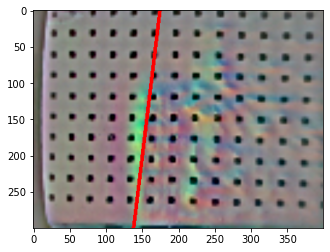

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38993192  0.58262694 -0.19593298  0.9211087 ]


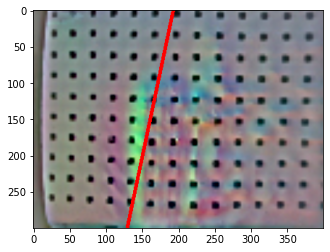

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38577786  0.54114276 -0.07857265  0.98981833]


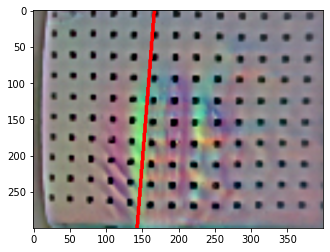

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.38428554  0.5409559  -0.0741008   1.001665  ]


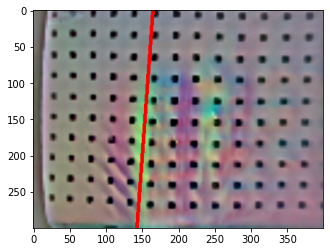

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4124984  0.5118527 -0.1315355  1.0229918]


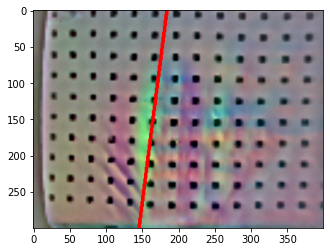

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.42061853  0.5134006  -0.10233923  1.0118659 ]


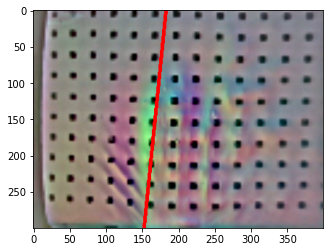

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4275295   0.56250995 -0.04296184  1.0092454 ]


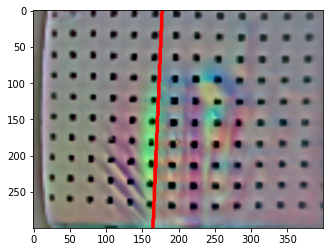

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.46909136  0.5337347  -0.05195249  0.968804  ]


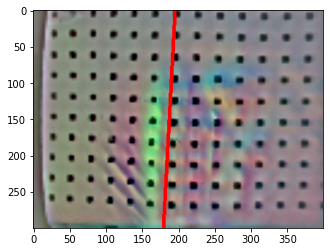

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44347632  0.54660296 -0.0044944   1.0007352 ]


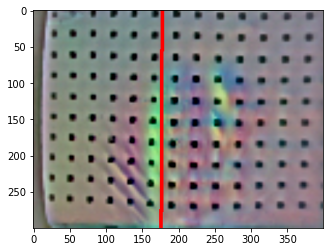

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44308168  0.58079815 -0.00272046  0.9858583 ]


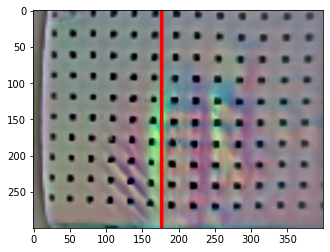

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4530974   0.55843055 -0.00912806  0.97864354]


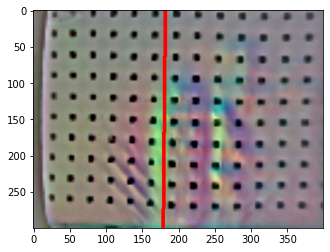

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44268602  0.5591005  -0.03326003  1.0045288 ]


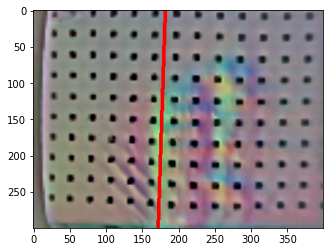

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44563383  0.5982787  -0.04472212  1.0117211 ]


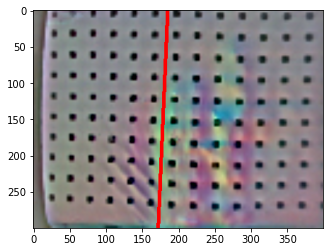

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.44760916  0.60815823 -0.03215832  0.9923972 ]


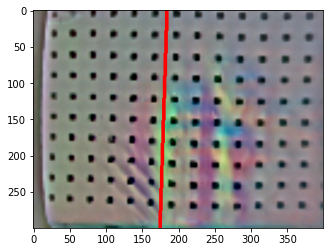

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.46780115  0.56897473 -0.11295242  0.9871731 ]


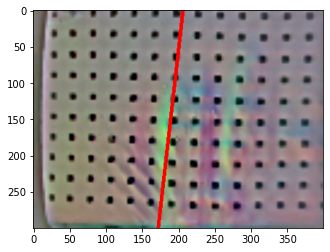

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.47212082  0.61812496 -0.03014159  0.99612784]


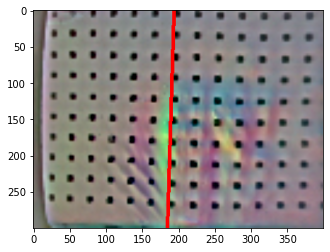

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[ 0.4794524   0.60198474 -0.09681144  1.0019214 ]


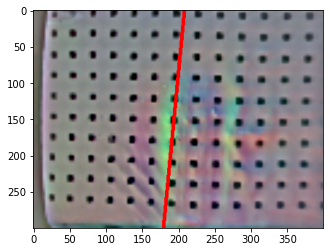

In [140]:
frame0 = gt3[0]
frame0_blur = cv2.GaussianBlur(frame0, (45, 45), 0)
# imgs = []

for _ in range(308, 630, 20):
    frame =gt1[_]
    diff = (frame * 1.0 - frame0_blur) / 255. * 3 + 0.5
    diff_small = cv2.resize(diff, (120, 90))
    depth, gx, gy = c3d.infer(diff_small * 255.0, demark=demark, display=False)
    depth3 = np.dstack([depth / 30] * 3)
#     rendered_small = cv2.resize(frame/255., (120, 90))

#     Y_pred = net.predict([rendered_small], device)
    Y_pred = net.predict([depth3], device)
    i = 0
#     x = rendered_small
    x = diff_small
    y = Y_pred[i]
    print(Y_pred[i])

    x = cv2.resize(x, (400, 300))
    theta = np.arctan2(y[2], y[3])
    rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
    plt.figure()
    imshow(rendered_img_line)

#     imgs.append(rendered_img_line)
